(nn/01-intro)=
# Introduction

![Status](https://img.shields.io/static/v1.svg?label=Status&message=Finished&color=brightgreen)
[![Source](https://img.shields.io/static/v1.svg?label=GitHub&message=Source&color=181717&logo=GitHub)](https://github.com/particle1331/ok-transformer/blob/master/docs/nb/dl/01-intro.ipynb)
[![Stars](https://img.shields.io/github/stars/particle1331/ok-transformer?style=social)](https://github.com/particle1331/ok-transformer)

---

**Readings:** [[CS182-lec1]](https://cs182sp21.github.io/static/slides/lec-1.pdf) [[CS182-lec2]](https://cs182sp21.github.io/static/slides/lec-2.pdf) [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf) [[CS4780-lec12]](https://www.cs.cornell.edu/courses/cs4780/2018sp/lectures/lecturenote12.html)

## Introduction

Deep learning models can be characterized as machine learning models with multiple layers of **learned representations**. Here a **layer** is any parametric transformation that maps an input to its feature representation. 
We will call any function that consist of multiple layers 
a **neural network**.
Representations are powerful: in machine translation, phrases are not translated 1-1 between 
words in two languages, instead an intermediate representation is learned between translated phrases ({numref}`01-thought`). 

```{figure} ../../img/nn/01-thought.png
---
name: 01-thought
width: 80%
---
Thought is a representation.
```

The practical success of deep learning can be further attributed to three factors:
* **complexity**: big models, many layers
* **data**: large datasets containing many examples
* **compute**: large compute (GPUs)

Are more layers better? Generally, yes ({numref}`01-imagenet-progress`). Higher level features are more abstract and invariant to noise which makes it easier to learn labels. 
This requires large models with many layers.
And consequently, it requires large datasets with many examples of all different scenarios. This is necessary for the complexity of distributions that it tries to learn. Both these requirements necessitate large compute ({numref}`01-gflops`).

```{figure} ../../img/nn/01-imagenet-progress.png
---
name: 01-imagenet-progress
width: 80%
---
Progress in top-5 error in the [ImageNet competition](https://en.wikipedia.org/wiki/ImageNet#ImageNet_Challenge).
```

```{figure} ../../img/nn/01-gflops.png
---
name: 01-gflops
width: 80%
---
ResNets are in the middle of the graph. GFlops are a good metric since a network can have large compute with small number of parameters (e.g. convolutions).
```

DL is resource intensive, so it is natural to ask whether it is a good idea.
The tradeoff is that DL models have very **high capacity** 
and are immediately **scalable** 
that as we add more layers, more data, and more compute, the 
models just get better and better. Moreover,
DL models acquire representations end-to-end purely from the data without requiring 
manual engineering of features or representations. 
Such representations are better tailored to the
current task and minimizes **inductive bias**. 
Indeed, DL has been able to beat several human
benchmark on specific tasks tasks {cite}`mnih2015human` {cite}`bert`.

**Remark.** Model capacity refers to how many 
different functions a particular model class can represent. Roughly if model capacity 
is sufficiently large, its function space contains the true function that underlies the 
task. 
Model capacity can be controlled by parameter count in certain architectures.
Inductive bias refers to built-in knowledge or biases in a model
designed to help it learn. All such knowledge is "bias" in the sense that
it makes some solutions more likely and some less likely. Scaling is the ability for an 
algorithm to work better as data and model capacity is increased.

## Fully-connected networks

Fully-connected networks consist of a sequence of **dense** layers followed by an [activation function](https://en.wikipedia.org/wiki/Activation_function). A dense layer consist of neurons which compute
$\mathsf{y}_k = \varphi(\boldsymbol{\mathsf{x}} \cdot \boldsymbol{\mathsf{w}}_k + b_k)$
for $k = 1, \ldots, H$ where the activation $\varphi\colon \mathbb{R} \to \mathbb{R}$ is a nonlinear function. The number of neurons $H$ is called the **width** of the layer. The number of layers in a network is called its **depth**. 

This can be written in terms of matrix multiplication: $\boldsymbol{\mathsf{X}}^1 = \varphi\left(\boldsymbol{\mathsf{X}}^0\,\boldsymbol{\mathsf{W}} + \boldsymbol{\mathsf{b}}\right)$ where $B$ data points in $\mathbb{R}^d$ are stacked so that the input $\boldsymbol{\mathsf{X}}^0$ has shape $(B, d)$ allowing the network to process data in parallel. The layer output is then passed as input to the next layer. 

```{figure} ../../img/nn/artificial-neuron.png
---
name: artificial-neuron
width: 80%
---
An artificial neuron is a simplistic mathematical model for the biological neuron. Biological neurons are believed to remain inactive until the net input to the cell body (soma) reaches a certain threshold, at which point the neuron gets *activated* and fires an electro-chemical signal. [Source](https://jermwatt.github.io/machine_learning_refined/notes/13_Multilayer_perceptrons/13_2_Multi_layer_perceptrons.html) 
```


```{margin}
[Universal approximation](https://en.wikipedia.org/wiki/Universal_approximation_theorem)
```

It turns out that fully-connected neural networks can approximate any continuous function $f$ from a closed and bounded set $K \subset \mathbb{R}^d$ to $\mathbb{R}^m.$ This is a reasonable assumption about a ground truth function which we assume to exist.  The following approximates a one-dimensional curve using a neural network with [ReLU activation](https://en.wikipedia.org/wiki/Rectifier_(neural_networks)): $z \mapsto \max(0, z)$ for $z \in \mathbb{R}.$

In [1]:
import torch

# Ground truth
x = torch.linspace(-2*torch.pi, 2*torch.pi, 1000)
y = torch.sin(x) + 0.3 * x

# Get (sorted) sample
B = torch.randint(0, 1000, size=(24,))
B = torch.sort(B)[0]
xs = x[B]
ys = y[B]

# ReLU approximation
z = torch.zeros(1000,)
for i in range(len(xs) - 1):
    if torch.isclose(xs[i + 1], xs[i]):
        m = torch.tensor(0.0)
    else:
        M = (ys[i+1] - ys[i]) / (xs[i+1] - xs[i])
        s, m = torch.sign(M), torch.abs(M)
    z += s * (torch.relu(m * (x - xs[i])) - torch.relu(m * (x - xs[i+1])))
z += ys[0]

Note this only works (consistent with the theorem) for target function with domain `[a, b]`.

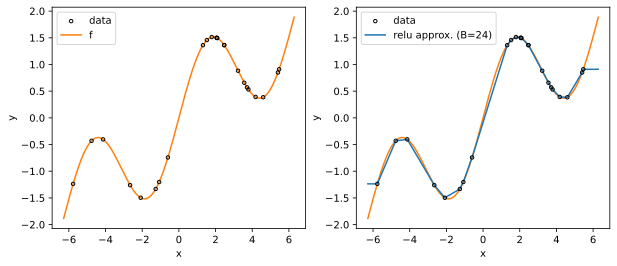

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_inline import backend_inline
backend_inline.set_matplotlib_formats('svg')

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].scatter(xs, ys, facecolor='none', s=12, edgecolor='k', zorder=3, label='data')
ax[0].plot(x, y, color="C1", label='f')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[0].legend();

ax[1].scatter(xs, ys, facecolor='none', s=12, edgecolor='k', zorder=4, label='data')
ax[1].plot(x, z, color="C0", label=f'relu approx. (B={len(B)})', zorder=3)
ax[1].plot(x, y, color="C1")
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')
ax[1].legend();

This works by constructing `___/‾‾‾` and `‾‾‾\___` functions similar to step functions but with slope in between adjacent points. The step functions increment each other starting with the constant function `ys[0]`. Note this correctly ends with a constant function `ys[-1]`.

## Linear classification

Neural networks learn separating hyperplanes after a sequence of transformations (layers) on the input data for classification tasks. The intermediate outputs of the layers are what we call representations. The distances of a data point to these hyperplanes are used as class scores or **logits**. Note that instead of labels, we want to predict probabilities since these can be perturbed. Note that we can apply any positive function $f$ to class scores to convert it to a probability vector:

$$p_j = \frac{f(s_j)}{\sum_k f(s_k)}.$$

A good choice for $f$ is the exponential function which maps $\mathbb R$ to $\mathbb R^+$ one-to-one. The resulting function is called the **softmax function**:

$$\text{softmax}(\boldsymbol{\mathsf{s}})_j = p_j = \frac{e^{s_j}}{\sum_k e^{s_k}}.$$

**Remark.** Notice that for binary classification we recover the **sigmoid**: $p_1 = {1}/\left(1 + e^{-(s_1 - s_0)}\right).$ This is [logistic regression](https://en.wikipedia.org/wiki/Logistic_regression) if we are using a single layer neural network with $s_k = \boldsymbol{\mathsf{w}}_k \cdot \boldsymbol{\mathsf{x}} + b_k$ so that $s_1 - s_0 = (\boldsymbol{\mathsf{w}}_1 - \boldsymbol{\mathsf{w}}_0) \cdot \boldsymbol{\mathsf{x}} + (b_1 - b_0)$. Since we learn a weight vector for each class, there are generally as many separating hyperplanes as the number of classes. For binary classification with softmax, the two vectors subtract out resulting in one separating plane.

In [3]:
s = np.linspace(-10, 10, 300)
p = 1 / (1 + np.exp(-s))

inv = lambda p: np.log(p / (1 - p))
threshold = 0.15
s_low  = inv(threshold)
s_high = inv(1 - threshold)

x0 = [-8.0, -7.8, -6.5, -5.0, -2.5, -1.25, 0.3, -7.6]
x1 = [-2.2,  0.0,  6.0,  1.3,  5.0,   7.5, 7.6,  8.3]

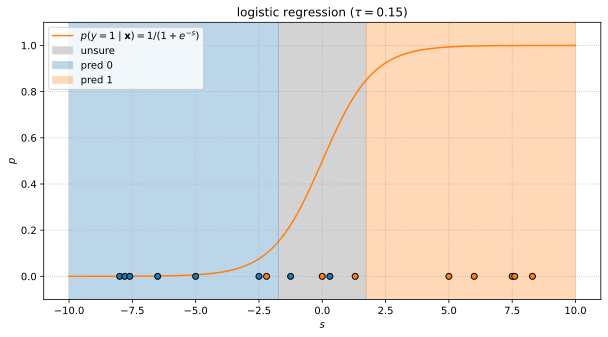

In [4]:
plt.figure(figsize=(10, 5))
plt.title(r"logistic regression ($\tau = 0.15$)")
plt.plot(s, p, label="$p(y=1 \mid {\mathbf{x}}) = 1 / (1 + e^{-s})$", color="C1")
for i in range(len(x0)):
    plt.scatter(x0[i], 0.0, color="C0", zorder=3, edgecolor='k')
    plt.scatter(x1[i], 0.0, color="C1", zorder=3, edgecolor='k')

plt.axvspan(s_low, s_high, -2.0, 2.0, color='lightgray', label="unsure")
plt.axvspan(-10.0, s_low,  -2.0, 2.0, color='C0', label="pred 0", alpha=0.3)
plt.axvspan(s_high, 10.0,  -2.0, 2.0, color='C1', label="pred 1", alpha=0.3)
plt.xlabel("$s$")
plt.ylabel("$p$")
plt.legend()
plt.ylim(-0.1, 1.1)
plt.grid(linestyle="dotted");

Note that the sigmoid assigns $p =\frac{1}{2}$ at the hyperplane where $s = 0.$ It scales symmetrically with respect to the distance of the data points from the decision boundary. This is nice otherwise the prediction will not be invariant with respect to relabeling. For the general case of multiclass classification, we will have class scores $s_k = \boldsymbol{\mathsf{w}}_k \cdot \boldsymbol{\mathsf{x}}$ and the softmax will act like a **voting function**. See [this video](https://www.youtube.com/watch?v=p-6wUOXaVqs) for deeper reasons on using the softmax function.

In [5]:
# grid of points
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)

# parameters
w = [1, 1]
b = 0

def sigmoid_neuron(x, y):
    z = w[0] * x + w[1] * y + b
    return 1 / (1 + np.exp(-z))

def relu_neuron(x, y):
    z = w[0] * x + w[1] * y + b
    return np.maximum(0, z)

The sigmoid unit assigns a gradient along the normal of the hyperplane defined by $\boldsymbol{\mathsf{w}}$ and $b$ in the input space $\mathbb{R}^2$. This effectively reduces the input
space to one dimension along the direction of ${\boldsymbol{\mathsf{w}}} = [1, 1].$ Here $H$ is the linear decision boundary defined by points $\boldsymbol{\mathsf{x}}$ such that $\boldsymbol{\mathsf{x}} \cdot \boldsymbol{\mathsf{w}} + b = 0.$ ReLU unit has sharp cutoff at zero.

In [6]:
from matplotlib.colors import LinearSegmentedColormap

colors = ["C0", "C1"]
n_bins = 100
cm = LinearSegmentedColormap.from_list(name="", colors=colors, N=n_bins)

def plot_grid(ax, X, Y, Z):
    p1 = (-0.45, -0.45)
    p2 = (1, 1)
    ax.annotate(f'$\mathsf{{w}}$', xy=p2, xytext=p1, arrowprops=dict(arrowstyle='->'))
    ax.plot(x, -x, color='k', linewidth=1, linestyle='dotted', label='H')

    im = ax.pcolormesh(X, Y, Z, shading='auto', cmap=cm)
    cbar = plt.colorbar(im, ax=ax)
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')
    ax.legend()


Z0 = sigmoid_neuron(X, Y)
Z1 = relu_neuron(X, Y)

fig, ax = plt.subplots(1, 2, figsize=(11, 4))
plot_grid(ax[0], X, Y, Z0)
plot_grid(ax[1], X, Y, Z1)

This is the immediate representation that gets passed to the next layer. The next layer can then take a weighted combination of these surfaces to construct a complex leveling of the input space. Another way to think about this is that a weight vector $\boldsymbol{\mathsf{w}}$ corresponds to a learned pattern, so that the projection $\boldsymbol{\mathsf{x}} \cdot \boldsymbol{\mathsf{w}}$ of the input $\boldsymbol{\mathsf{x}}$ to $\boldsymbol{\mathsf{w}}$ corresponds to a scaled similarity. The activation function determines whether this plus the bias $b$ is enough to activate the unit.

### Negative log loss (MLE)

The machine learning method follows four steps: defining a model, defining a loss function,
choosing an optimizer, and running it on large compute (e.g. GPUs). A **loss function** 
acts a smooth surrogate to the true objective which may not be amenable to available optimization 
techniques. Hence, we can think of loss functions as a measure of model quality.
The choice of loss function determines what the model parameters will optimize towards.

Here we derive a loss function based on [maximum likelihood estimation](https://en.wikipedia.org/wiki/Maximum_likelihood_estimation#:~:text=In%20statistics%2C%20maximum%20likelihood%20estimation,observed%20data%20is%20most%20probable) (MLE). This results in finding optimal parameters such that the dataset is more probable. Consider a parametric model of the target $p_{\boldsymbol{\Theta}}(y \mid \boldsymbol{\mathsf{x}}).$ 
The **likelihood** of the [iid](https://en.wikipedia.org/wiki/Independent_and_identically_distributed_random_variables) sample $\mathcal{D} = \{(\boldsymbol{\mathsf{x}}_i, y_i)\}_{i=1}^N$ can be defined as

$$
\begin{aligned}
L(\boldsymbol{\Theta}) 
= \left({\prod_{i=1}^N {p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i)}}\right)^{\frac{1}{N}}.
\end{aligned}
$$

This can be thought of as the probability assigned by the parametric model on the sample.
The iid assumption is important. It also means that the model gets to focus on inputs 
that are more probable since they are better represented in the sample. 
Probabilities are
small numbers in $[0, 1]$ and we are multiplying lots of them, so applying the logarithm which is monotonic
and converts the product into a sum is a good idea:

$$
\begin{aligned}
\log L(\boldsymbol{\Theta}) 
&= \frac{1}{N}\sum_{i=1}^N \log p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i).
\end{aligned}
$$

MLE then maximizes the log-likelihood with respect to the parameters $\boldsymbol{\Theta}.$ The idea is that a good model should make the data more probable. It is common practice in optimization literature to convert this to a minimization problem. The following then becomes our optimization problem:

$$\boldsymbol{\Theta}^* = \underset{\boldsymbol{\Theta}}{\text{argmin}}\,\left( -\frac{1}{N}\sum_{i=1}^N \log p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i)\right).$$

This allows us to define $\ell = -\log p_{\boldsymbol{\Theta}}(y \mid \boldsymbol{\mathsf{x}}).$ In general, the loss function can be any nonnegative function whose value approaches zero whenever the prediction of the network the target value. Observe that:

- $p_{\boldsymbol{\Theta}}(y \mid \boldsymbol{\mathsf{x}}) \to 1$ $\implies$ $\ell \to 0$
- $p_{\boldsymbol{\Theta}}(y \mid \boldsymbol{\mathsf{x}}) \to 0$ $\implies$ $\ell \to \infty$ 

Using an expectation of the loss over the underlying distribution allows the model to focus on errors based on its probability of occuring. For parameters $\boldsymbol{\Theta},$ we will approximate the **true risk** which is the expectation of $\ell$ on the underlying distribution with the **empirical risk** calculated on the sample $\mathcal{D}$:

```{math}
:label: risk
\begin{aligned}
\mathcal{L}(\boldsymbol{\Theta}) 
&= \mathbb{E}_{\boldsymbol{\mathsf{x}},y}\left[\ell(y, f_{\boldsymbol{\Theta}}(\boldsymbol{\mathsf{x}}))\right] \\
&\approx \mathcal{L}_\mathcal{D}(\boldsymbol{\Theta}) = \frac{1}{|\mathcal{D}|} \sum_i \ell(y_i, f_{\boldsymbol{\Theta}}(\boldsymbol{\mathsf{x}}_i)).
\end{aligned}
```

The optimization problem can be written more generally as
$\boldsymbol{\Theta}^* = \underset{\boldsymbol{\Theta}}{\text{argmin}}\, \mathcal{L}_\mathcal{D}(\boldsymbol{\Theta})
$.

### Gradient descent

Now that we have the empirical risk $\mathcal{L}_\mathcal{D}(\boldsymbol{\Theta})$ {eq}`risk` as objective, we proceed to the actual optimization algorithm. Given the current parameters $\boldsymbol{\Theta} \in \mathbb R^M$ of the network, we can imagine the network to be sitting on a point $(\boldsymbol{\Theta}, \mathcal L_{\mathcal{D}}(\boldsymbol{\Theta}))$ on a surface in $\mathbb R^M \times \mathbb R.$ The surface will generally vary for different samples of the training data. Training is equivalent to finding the minimum of this surface. 
Gradients arise in deep learning when making the following first-order approximation:

$$\Delta \mathcal L_{\mathcal{D}} \approx  \sum_k \left(\frac{\partial \mathcal L_{\mathcal{D}}}{ \partial {\Theta}_k} \right)  \Delta {\Theta}_k = \left( \nabla_{\boldsymbol{\Theta}}\, \mathcal L_{\mathcal{D}} \right) \cdot \Delta {\boldsymbol{\Theta}}.$$ 

It follows that $-\nabla_{\boldsymbol{\Theta}}\, \mathcal L_{\mathcal{D}}$ is the direction of steepest descent at the current point $(\boldsymbol{\Theta}, \mathcal L_{\mathcal{D}})$ in the surface. **Gradient descent** (GD) is defined by the update rule: 

$$
\boldsymbol{\Theta}^{t+1} = \boldsymbol{\Theta}^t - \eta\; \nabla_{\boldsymbol{\Theta}}\, \mathcal L_{\mathcal{D}}(\boldsymbol{\Theta}^t)
$$

where the **learning rate** $\eta > 0$ controls the step size. Note that finding good **initial weights** $\boldsymbol{\Theta}^0 \in \mathbb{R}^M$ is crucial since networks has lots of internal symmetries and can diverge in the early stages of training. Later on we will see that other optimization algorithms in deep learning practice are just modifications of GD.

In [7]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting
import numpy as np

def plot_surface(ax, data, target, N=50):
    x = np.linspace(-5, 5, N)
    y = np.linspace(-5, 5, N)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(N):
        for j in range(N):
            Z[i, j] = loss(np.array([X[i, j], Y[i, j]]), data, target)
    
    ax.plot_surface(X, Y, Z, cmap='Reds')
    ax.set_xlabel(f'$w_0$')
    ax.set_ylabel(f'$w_1$')
    ax.set_title('loss surface')
    

def plot_contourf(ax, data, target, w_min, w_hist, title="", N=50):
    x = np.linspace(-5, 5, N)
    y = np.linspace(-5, 5, N)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(N):
        for j in range(N):
            Z[i, j] = loss(np.array([X[i, j], Y[i, j]]), data, target)

    for t in range(1, len(w_hist)):
        ax.plot([w_hist[t-1][0], w_hist[t][0]], [w_hist[t-1][1], w_hist[t][1]], color='k')

    c = ax.contourf(X, Y, Z, levels=20, cmap='Reds')
    ax.scatter(w_min[0], w_min[1], color="red", label='min', zorder=3)
    ax.scatter(w_hist[:, 0], w_hist[:, 1], marker='o', s=5, facecolors='k')
    ax.set_title(title)
    ax.set_xlabel(f'$w_0$')
    ax.set_ylabel(f'$w_1$')
    plt.colorbar(c, ax=ax)

In [8]:
def loss(w, X, y):
    return ((X @ w - y)**2).mean()

def grad(w, X, y, B=None):
    """Gradient step for the MSE loss function"""
    dw = 2*((X @ w - y).reshape(-1, 1) * X).mean(axis=0)
    return dw / np.linalg.norm(dw)

def grad_descent(w0, X, y, eta=0.1, steps=10):
    """Return sequence of weights from GD."""
    w = np.zeros([steps, 2])
    w[0, :] = w0
    for j in range(1, steps):
        u = w[j-1, :]
        w[j, :] = u - eta * grad(u, X, y)
    return w


# Generate data
n = 1000
X = np.zeros((n, 2))
X[:, 1] = np.random.uniform(low=-1, high=1, size=n)
X[:, 0] = 1
w_min = np.array([-1, 3])
y = (X @ w_min) + 0.05 * np.random.randn(n)  # data: y = -1 + 3x + noise

# Gradient descent
w_init = [-4, -4]
w_step = grad_descent(w_init, X, y, eta=0.5, steps=25)

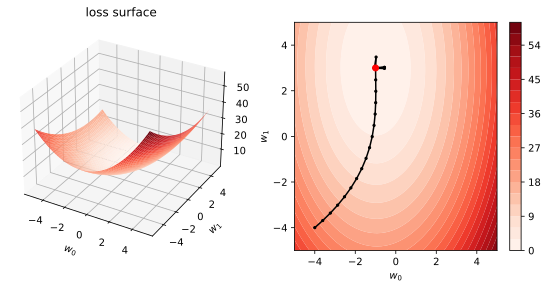

In [9]:
# Create a figure and two subplots
fig = plt.figure(figsize=(8, 4))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122)

# Call the functions with the respective axes
plot_surface(ax1, X, y)
plot_contourf(ax2, X, y, w_min, w_step)
plt.tight_layout()
plt.show()

**Figure.** Loss surface (left) and gradient descent (right) of a linear function with MSE loss.

(01-nonlinear-decision-boundary)=
### Nonlinear decision boundary

Going back to classification. Let us generate data that is **not** linearly separable. 
In this section, we will show that linear classification extends to input data that is not linearly separable.
The idea is to apply a sequence of transformations on the input such that the final result becomes linearly separable.

In [10]:
import torch 
torch.manual_seed(2)

N = 1500  # sample size
noise = lambda e: torch.randn(N, 2) * e
t = 2 * torch.pi * torch.rand(N, 1)
s = 2 * torch.pi * torch.rand(N, 1)

x0 = torch.cat([0.1 * torch.cos(s), 0.1 * torch.sin(s)], dim=1) + noise(0.05)
x1 = torch.cat([1.0 * torch.cos(t), 1.0 * torch.sin(t)], dim=1) + noise(0.1)
y0 = (torch.ones(N,) * 0).long()
y1 = (torch.ones(N,) * 1).long()

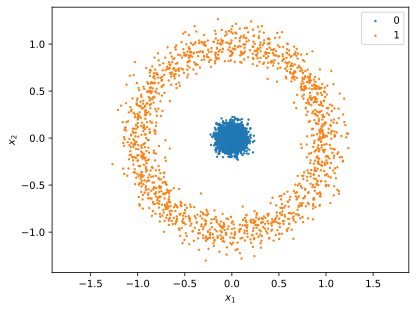

In [11]:
plt.scatter(x0[:, 0], x0[:, 1], s=2.0, label=0, color="C0")
plt.scatter(x1[:, 0], x1[:, 1], s=2.0, label=1, color="C1")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.legend()
plt.axis('equal');

Modeling this with a fully-connected neural network with one hidden layer containing units that uses the [tanh function](https://mathworld.wolfram.com/HyperbolicTangent.html) as activation: $\text{tanh}(z) = \frac{e^{z} - e^{-z}}{e^{z} + e^{-z}}.$
This maps $\mathbb{R}$ to $[-1, 1]$ symmetrically with $\text{tanh}(0) = 0$ and $\text{tanh}(z) \to \pm 1$ as $z \to \pm\infty.$ Note that tanh is actually just a scaled and translated version of the sigmoid function.

In [12]:
import torch.nn as nn
from torchsummary import summary

model = lambda: nn.Sequential(
    nn.Linear(2, 3), nn.Tanh(),
    nn.Linear(3, 2)
)

summary(model(), input_size=(2,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 3]               9
              Tanh-2                    [-1, 3]               0
            Linear-3                    [-1, 2]               8
Total params: 17
Trainable params: 17
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------


Gradient descent on the [cross-entropy loss](https://en.wikipedia.org/wiki/Cross-entropy) (equivalent to NLL):

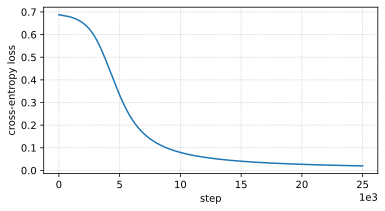

In [13]:
import torch.nn.functional as F

net = model()
loss_fn = lambda logits, y: F.cross_entropy(logits, y)
optim = torch.optim.SGD(net.parameters(), lr=0.01)

x = torch.cat([x0, x1])
y = torch.cat([y0, y1])
history = []
for step in range(25000):
    logits = net(x)
    loss = loss_fn(logits, y)
    loss.backward()
    optim.step()
    optim.zero_grad()
    history.append(loss.item())

plt.figure(figsize=(6, 3))
plt.plot(history)
plt.xlabel("step")
plt.grid(linestyle="dotted", alpha=0.8)
plt.ticklabel_format(axis="x", style="sci", scilimits=(3, 3))
plt.ylabel("cross-entropy loss");

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# transformations
linear_0 = net[0](x0).detach().numpy()
linear_1 = net[0](x1).detach().numpy()
linear_relu_0 = net[1](net[0](x0)).detach().numpy()
linear_relu_1 = net[1](net[0](x1)).detach().numpy()

# separating hyperplane (see above discussion, i.e. w <- w1 - w0  == logistic reg)
h = 1
w, b = net[2].parameters()
w, b = (w[h] - w[h-1]).detach().numpy(), (b[h] - b[h-1]).detach().numpy()

# plot
fig = plt.figure(figsize=(12, 4))
ax0 = fig.add_subplot(131)
ax1 = fig.add_subplot(132, projection='3d')
ax2 = fig.add_subplot(133, projection='3d')

ax0.grid(alpha=0.8, linestyle="dotted")
ax0.set_axisbelow(True)
ax0.scatter(x0[:, 0], x0[:, 1], s=2.0, label=0, color="C0")
ax0.scatter(x1[:, 0], x1[:, 1], s=2.0, label=1, color="C1")
ax0.set_xlabel("$x_1$")
ax0.set_ylabel("$x_2$")
ax0.set_xlim(-1.5, 1.5)
ax0.set_ylim(-1.5, 1.5)
ax0.set_title("(a) input")
ax0.legend()
ax0.axis('equal')

ax1.scatter(linear_0[:, 0], linear_0[:, 1], linear_0[:, 2], s=3, label=0, color="C0")
ax1.scatter(linear_1[:, 0], linear_1[:, 1], linear_1[:, 2], s=3, label=1, color="C1")
ax1.set_xlabel('$x_1$')
ax1.set_ylabel('$x_2$')
ax1.set_zlabel('$x_3$')
ax1.set_title('(b) linear')

ax2.scatter(linear_relu_0[:, 0], linear_relu_0[:, 1], linear_relu_0[:, 2], s=3, label=0, color="C0")
ax2.scatter(linear_relu_1[:, 0], linear_relu_1[:, 1], linear_relu_1[:, 2], s=3, label=1, color="C1")
ax2.set_xlabel('$x_1$')
ax2.set_ylabel('$x_2$')
ax2.set_zlabel('$x_3$')
ax2.set_title('(c) linear + tanh')

# Generate grid of points
x_min = min(linear_relu_1[:, 0].min(), linear_relu_0[:, 0].min())
x_max = max(linear_relu_1[:, 0].max(), linear_relu_0[:, 0].max())
y_min = min(linear_relu_1[:, 1].min(), linear_relu_0[:, 1].min())
y_max = max(linear_relu_1[:, 1].max(), linear_relu_0[:, 1].max())
a, b, c, d = w[0], w[1], w[2], b
x = np.linspace(x_min, x_max, 50)
y = np.linspace(y_min, y_max, 50)
X, Y = np.meshgrid(x, y)
Z = (-a * X - b * Y - d) / c

# Plot the hyperplane for the positive class
ax2.plot_surface(X, Y, Z, alpha=0.5, color=f"C{h}")
fig.tight_layout();

Checking classification accuracy:

In [15]:
a = (torch.argmax(net(x0), dim=1) == y0).float().mean().item()
b = (torch.argmax(net(x1), dim=1) == y1).float().mean().item()
a, b

(1.0, 1.0)

Decision boundary in the input space. Note that we have to convert logits to probabilities:

In [16]:
def prediction(x, y):
    p = F.softmax(net(torch.tensor([[x, y]])), dim=1)
    return p[0, 1].item()

In [17]:
from matplotlib.colors import LinearSegmentedColormap

# Define your custom colormap
colors = ["C0", "C1"]
n_bins = 100
cm = LinearSegmentedColormap.from_list(name="", colors=colors, N=n_bins)

# Create a grid of points
N = 100
x = np.linspace(-1.5, 1.5, N)
y = np.linspace(-1.5, 1.5, N)
X, Y = np.meshgrid(x, y)

# Calculate function values for each point on the grid
Z = np.zeros_like(X)
for i in range(N):
    for j in range(N):
        Z[i, j] = prediction(float(X[i, j]), float(Y[i, j]))

# Create a color plot using the custom colormap
plt.pcolormesh(X, Y, Z, shading='auto', cmap=cm)
plt.colorbar()
plt.xlabel('X')
plt.ylabel('Y')

plt.scatter(x0[:, 0], x0[:, 1], s=10.0, label=0, color="C0", edgecolor="black")
plt.scatter(x1[:, 0], x1[:, 1], s=10.0, label=1, color="C1", edgecolor="black")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.legend()
plt.axis('equal');

plt.xlim(-1.5, 1.5)
plt.ylim(-1.5, 1.5)
plt.show();

**Figure.** Probability assigned by the trained network on the input space. Note that we were able to extend linear classification to learning a nonlinear decision boundary. Using ReLU activation here instead of Tanh results in a boundary with sharp corners. This can be thought of as a manifestation of inductive bias.

## Loss minimization

For each choice of model parameters $\boldsymbol{\Theta}$, we defined the empirical risk  $\mathcal{L}_\mathcal{D}(\boldsymbol{\Theta})$ as an unbiased estimate of the true risk $\mathcal{L}(\boldsymbol{\Theta})$ defined as the expected loss on the underlying distribution given the model $f_{\boldsymbol{\Theta}}$ (see {eq}`risk`). It is natural to ask whether this is an accurate estimate. There are two things to watch out for when training our models:

* **Overfitting.** This is characterized by having low empirical risk, but high true risk. This can happen if the dataset is too small to be representative of the true distribution. Or if the model is too complex. In the latter case, the model will interpolate the sample, but will have arbitrary behavior between datapoints.

+++

* **Underfitting.** Here the empirical risk, and thereby the true risk, is high. This can happen if the model is too weak (low capacity, or too few parameters) &mdash; e.g. too strong regularization. Or if the optimizer is not configured well (e.g. wrong learning rate), so that the parameters $\boldsymbol{\Theta}$ found are inadequate even on the training set.

<br>

Observe that MLE is by definition prone to overfitting. We rely on smoothness between data points for the model to generalize to test data. It is important to analyze the error between different **training samples**. A well-trained model should not look too different between samples. But we also don't want it to have the same errors with different data! ({numref}`01-overfitting-underfitting`)

<br>

```{figure} ../../img/nn/01-overfitting-underfitting.png
---
name: 01-overfitting-underfitting
width: 100%
---
Drawing of a model that overfits and underfits the distribution. Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

### Bias-variance tradeoff

Let us analyze the squared error of trained models. We will assume the existence of a a ground truth function $f$. Let $f_{\mathcal{D}}$ be the function obtained by the training process over the sample $\mathcal{D}.$ Let $\bar{f}$ be the expected function when drawing fixed sized samples $\mathcal{D} \stackrel{\text{iid}}{\sim} P^N$ where $N = |\mathcal{D}|$ and $P$ is the underlying data distribution. In other words, $\bar{f}$ is an ensemble of trained models weighted by the probability of its training dataset. Then:

$$
\begin{aligned}
\mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ \left(f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}) \right)^2 \right]
&= \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ \left((f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - \bar{f}(\boldsymbol{\mathsf{x}})) + (\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}})) \right)^2 \right] \\
&= \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - \bar{f}(\boldsymbol{\mathsf{x}}))^2 \right] 
+ 2\, \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[(f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))(\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}})) \right] + \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[(\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))^2 \right] \\
&= \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - \bar{f}(\boldsymbol{\mathsf{x}}))^2 \right] 
+ 0 + \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[(\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))^2 \right] \\
&= \underbrace{\mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - \bar{f}(\boldsymbol{\mathsf{x}}))^2 \right]}_{\text{Variance}} 
 + \underbrace{\mathbb{E}_{\boldsymbol{\mathsf{x}}}\left[(\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))^2 \right]}_{\text{Bias}^2}. \\
\end{aligned} \\
$$

The middle term vanishes by writing it as: 

$$
\mathbb{E}_{\boldsymbol{\mathsf{x}}} \left[\underbrace{\mathbb{E}_{\mathcal{D}}\left[(f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))\right]}_{0} \; (\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))  \right] = 0.
$$

Observe that the **variance** term describes variability of models as we re-run the training process without actually looking into the true function. The **bias** term, on the other hand, looks at the error of the ensemble $\bar{f}$ from the true function $f.$ These can be visualized as manifesting in the left and right plots respectively of {numref}`01-overfitting-underfitting`.

**Remark.** This derivation ignores target noise which is relevant in real-world datasets. Here we have a distribution $p(y \mid \boldsymbol{\mathsf{x}})$ around the target which we have to integrate over to get the expected target. See [these notes](https://www.cs.cornell.edu/courses/cs4780/2018sp/lectures/lecturenote12.html) for a more careful treatment.

<br>

**Classical tradeoff.** There is a tradeoff with respect to model complexity for fixed $n.$ If we increase model complexity, these models will fit each sample too well that it captures even sampling noise. However, these cancels out over many samples resulting in low bias. Overfitting occurs because we get a model that performs well on the training sample, but may not perform well on a test sample due to high variability. On the other hand, simpler models tend to have high bias and underfits any sample of the dataset. Note that using a sufficiently large sample size for a fixed model class can decrease variance as more data will result in drowning out noise. But bias does not go away no matter how much data we have! {cite}`barron` provides an explicit tradeoff between data and network size for a certain class of fully-connected neural networks and training algorithm:

$$
\mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ \left(f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}) \right)^2 \right] \leq O\left(\frac{1}{M}\right) + O\left(\frac{Md}{N}\right)\log N
$$

where $M$ is the number of nodes, $N = |\mathcal{D}|$ is the number of training observations, and $d$ is the input dimension. Here the first term corresponds to the bias which is data independent, while the second term corresponds to the variance which increases with network size and decreases with data. This bound also highlights the **curse of dimensionality**. The input dimension contributes linearly to the error, while data only decreases error at the rate $O(\log N / N)$.

**Double descent.** Moreover, there is the phenomenon of **double descent** {cite}`double-descent` observed in most networks used in practice where both bias and variance go down with excess complexity. See [this interview](https://www.youtube.com/watch?v=W_TAKJRgrbs) by one of the authors. One intuition is that near the **interpolation threshold** where there is roughly a 1-1 correspondence between all the sample datasets and the models, small changes in the dataset lead to large changes in the model. This is the **critical regime** in the classical case where overfitting occurs. Having more data destroys this 1-1 correspondence, which is covered by the classical tradeoff described above. 

Double descent occurs in the opposite case where we have much more parameters than data ({numref}`01-double-descent`). SGD gets to focus more on what it wants to do, i.e. search for **flat minima** {cite}`flat-minima`, since it is not constrained to use the full model capacity. Note that the double descent curve is more prominent when there is label noise. Perhaps the complexity tradeoff is sharper since there is less redundancy in parameters of the model when the dataset is harder to learn. 

**Remark.** Models around with weights flat minimas have validation errors that are much more stable to perturbation in the weights and, as such, tend to be smooth between data points {cite}`hochreiter1997flat`. SGD is discussed in the next chapter.

<br>

```{figure} ../../img/nn/01-double-descent.png
---
name: 01-double-descent
width: 80%
---
Double descent for ResNet18. The width parameter controls model complexity. Source: {cite}`double-descent`
```

<br>

```{figure} ../../img/nn/01-double-descent-data.png
---
name: 01-double-descent-data
width: 90%
---
Additional data increases model variance within the critical regime.
More data shifts the interpolation threshold to the right, resulting in
worse test performance compared to the same model trained on a smaller sample. 
Increasing model complexity improves test performance.
Source: {cite}`double-descent`
```

<br>

```{figure} ../../img/nn/01-double-descent-epochs.png
---
name: 01-double-descent-epochs
width: 100%
---
Epoch dimension to double descent. Models are ResNet18s on CIFAR10
with 20% label noise, trained using Adam with learning rate 0.0001, and data augmentation. 
**Left:** Training dynamics for models in three regimes. **Right:** Test error vs. Model size × Epochs. 
Three slices of this plot are shown on the left. Source: {cite}`double-descent`
```

### Regularization

How do we control bias and variance? There are two solutions: (1) getting **more data**, (2) tuning **model complexity**. More data decreases variance but has no effect on bias. Increasing complexity decreases bias but increases variance. Since biased models do not scale well with data, a good approach is to start with a complex model and decrease complexity it until we get a good tradeoff. This approach is called **regularization**. Regularization can be thought of as a continuous knob on complexity that smoothly restricts model class.

<br>

```{figure} ../../img/nn/01-high-variance.png
---
name: 01-high-variance
width: 90%
---
All these have zero training error. But the third one is better. This is because resampling will result in higher empirical risk for the first two, which implies high true risk. Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

**Bayesian perspective.** High variance occurs when data does not give enough information to identify parameters. If we provide enough information to disambiguate between (almost) equally good models, we can pick the best one. One way to provide more information is to make certain parameter values more likely. In other words, we assign a **prior** on the parameters. Since the optimizer picks parameter values based on the loss, we can look into how we can augment the loss function to do this. Instead of MLE, we do a [MAP estimate](https://en.wikipedia.org/wiki/Maximum_a_posteriori_estimation) for $\boldsymbol{\Theta}$:

$$
\begin{aligned}
p(\boldsymbol{\Theta} \mid \mathcal{D}) &\propto p(\boldsymbol{\Theta}) \; {p(\mathcal{D} \mid \boldsymbol{\Theta})} \\[4pt]
&= p(\boldsymbol{\Theta}) \, \prod_i \frac{p(\boldsymbol{\mathsf{x}}_i, y_i, \boldsymbol{\Theta})}{ p(\boldsymbol{\Theta})\,p(\boldsymbol{\mathsf{x}}_i)} \,p(\boldsymbol{\mathsf{x}}_i)
\\
&= p(\boldsymbol{\Theta}) \, \prod_i \frac{p(\boldsymbol{\mathsf{x}}_i, y_i, \boldsymbol{\Theta})}{ p(\boldsymbol{\mathsf{x}}_i, \boldsymbol{\Theta})} \,p(\boldsymbol{\mathsf{x}}_i)
\\
&= p(\boldsymbol{\Theta}) \, \prod_i p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i) \,p(\boldsymbol{\mathsf{x}}_i).
\\
\end{aligned}
$$

Note we used independence between params and input. This also means that the term for the input is an additive constant, and therefore ignored in the resulting loss: 

$$
\mathcal{L}_{\mathcal{D}}(\boldsymbol{\Theta}) = - \left (\sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i) \right) - \underbrace{\log p(\boldsymbol{\Theta})}_{\text{we choose this}}.
$$

Can we pick a prior that makes the smoother function more likely?
This can be done by assuming a distribution on $\boldsymbol{\Theta}$ that assigns higher probabilities to **small** weights: e.g. $p(\boldsymbol{\Theta}) \sim \mathcal{N}(\mathbf{0}, \sigma^2\mathbf{I}).$ This may result
in a smoother fit ({numref}`01-high-variance`c). Solving the prior:

$$
\begin{aligned}
\log p(\boldsymbol{\Theta}) 
&= \sum_{j} \left(-\frac{1}{2\sigma^2} {\theta_j}^2  - \log \sigma - \frac{1}{2} \log 2 \pi \right) \\
&= - \lambda \lVert \boldsymbol{\Theta} \rVert^2 + \text{const.} \\
\end{aligned}
$$

where $\lambda > 0$  and $\lVert \cdot \rVert$ is the L2 norm. 
Since we choose the prior, $\lambda$ effectively becomes a **hyperparameter** that controls the strength of regularization. The resulting loss has the **L2 regularization** term:  


$$
\mathcal{L}_{\mathcal{D}}(\boldsymbol{\Theta}) = - \left( \sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i) \right) - \lambda \lVert \boldsymbol{\Theta} \rVert^2.
$$

The same analysis with a [Laplace prior](https://en.wikipedia.org/wiki/Laplace_distribution) results in the **L1 regularization** term: 

$$- \lambda \lVert \boldsymbol{\Theta} \rVert_1 = -\lambda \sum_j |\theta_j|.$$

**Remark.** It makes sense that MAP estimates result in weight penalty since the weight distribution is biased towards low values. 
Intuitively, large weights means that the network is memorizing the training dataset, and we get sharper probability distributions 
with respect to varying input features. Since the class of models are restricted to having low weights, this puts a constraint on 
the model class, resulting in decreased complexity. 
Note that these regularizers introduce hyperparameters that we have to tune well. See experiments below.

<br>

```{figure} ../../img/nn/01-regularization-contour.png
---
name: 01-regularization-contour
width: 80%
---
Minimizing both prediction loss and regularization loss surfaces. L1
results in sparse weights since moving along the axes results in minimal increase in the prediction loss
with maximal decrease in regularization loss.
Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

**Other perspectives.** The numerical perspective is that adding a regularization term in the loss can make underdetermined problems well-determined. The optimization perspective is that the regularizer makes the loss landscape easier to search.
Paradoxically, regularizers can sometimes reduce underfitting if it was due to poor optimization!
Other types of regularizers are ensembling (e.g. [dropout](https://machinelearningmastery.com/dropout-for-regularizing-deep-neural-networks/)) and [gradient penalty](https://towardsdatascience.com/demystified-wasserstein-gan-with-gradient-penalty-ba5e9b905ead) (for GANs).

### Experiments

In [18]:
x = torch.linspace(-10, 10, 1000)
y = 3 * torch.sin(x) + torch.cos(torch.pi * x)


def model(width, sample_size, alpha=0.0, x=x, y=y):
    """Fitting a wide fully connected ReLU network."""
    
    x = x.reshape(-1, 1)
    y = y.reshape(-1, 1)
    N = torch.randint(0, 1000, size=(sample_size,))
    N = torch.sort(N)[0]
    xs = x[N]
    ys = y[N]

    net = nn.Sequential(
        nn.Linear(1, width),
        nn.Tanh(),
        nn.Linear(width, 1)
    )
    theta = net.parameters()
    optim = torch.optim.Adam(theta, lr=0.1, weight_decay=alpha)

    for _ in range(100):
        loss = F.mse_loss(ys, net(xs))
        loss.backward()
        optim.step()
        optim.zero_grad()

    return net(x).reshape(-1).detach().cpu().numpy()


def variance(sample_preds):
    p_bar = sum(sample_preds) / len(sample_preds)
    return sum([((p_bar - p) ** 2).mean() for p in sample_preds]) / len(sample_preds)

def bias(sample_preds):
    p_bar = sum(sample_preds) / len(sample_preds)
    return ((p_bar - y.numpy()) ** 2).mean()

Decreasing model complexity decreases variance:

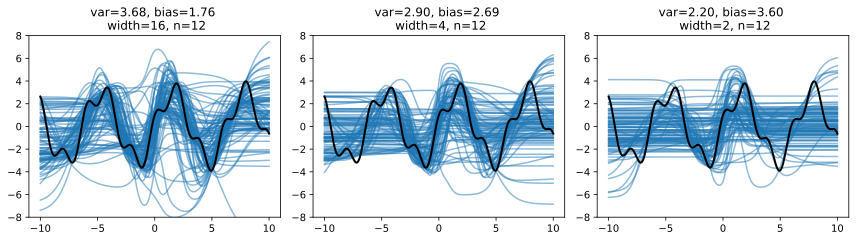

In [19]:
def reset_seed():
    np.random.seed(0)
    torch.manual_seed(0)

def plot_model(ax, width=6, sample_size=6, alpha=0.0, count=300):
    sample_preds = []
    for i in range(count):
        p = model(width, sample_size, alpha)
        if i < 100:
            ax.plot(x, p, alpha=0.5, color="C0")
        sample_preds.append(p)
    
    var = variance(sample_preds)
    b = bias(sample_preds)

    title = f"var={var:.2f}, bias={b:.2f} \n width={width}, n={sample_size}"
    if alpha > 0:
        title += f", $\lambda$={alpha:.0e}"
    
    ax.set_title(title)
    ax.plot(x, y, color="black", linewidth=2)
    ax.set_ylim(-8, 8)


reset_seed()
fig, ax = plt.subplots(1, 3, figsize=(12, 3.5))
plot_model(ax[0], width=16, sample_size=12)
plot_model(ax[1], width=4,  sample_size=12)
plot_model(ax[2], width=2,  sample_size=12)
fig.tight_layout()

Regularization decreases variance and increases bias:

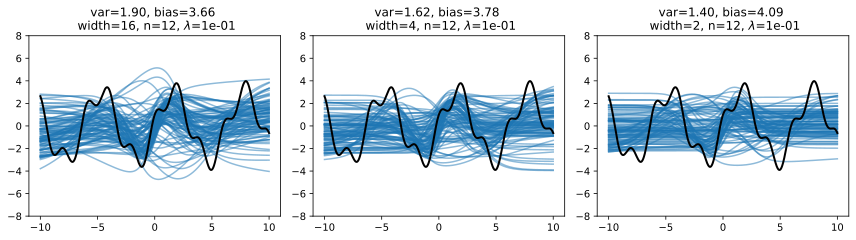

In [20]:
reset_seed()
fig, ax = plt.subplots(1, 3, figsize=(12, 3.5))
plot_model(ax[0], width=16, sample_size=12, alpha=0.1)
plot_model(ax[1], width=4,  sample_size=12, alpha=0.1)
plot_model(ax[2], width=2,  sample_size=12, alpha=0.1)
fig.tight_layout()

More data decreases variance so that bias dominates:

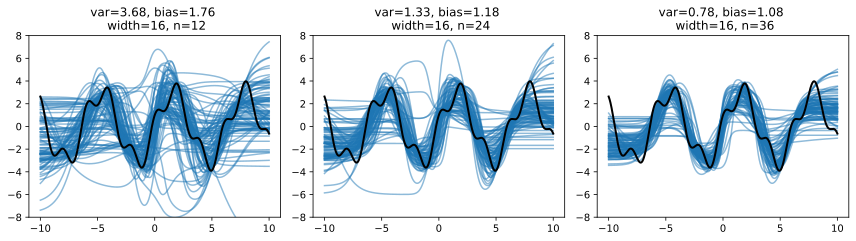

In [21]:
reset_seed()
fig, ax = plt.subplots(1, 3, figsize=(12, 3.5))
plot_model(ax[0], width=16, sample_size=12)
plot_model(ax[1], width=16, sample_size=24)
plot_model(ax[2], width=16, sample_size=36)
fig.tight_layout()

Regularization when too strong can make low complexity models underfit:

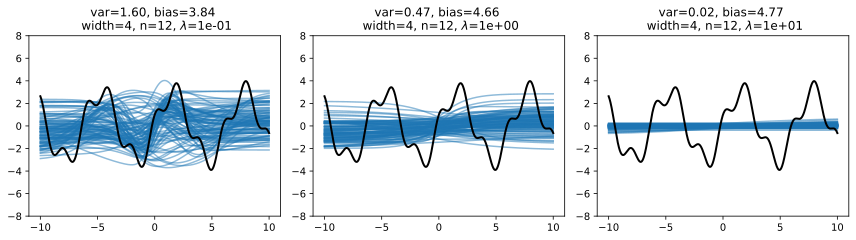

In [22]:
reset_seed()
fig, ax = plt.subplots(1, 3, figsize=(12, 3.5))
plot_model(ax[0], width=4, sample_size=12, alpha=0.1)
plot_model(ax[1], width=4, sample_size=12, alpha=1.0)
plot_model(ax[2], width=4, sample_size=12, alpha=10.0)
fig.tight_layout()

**Remark.** Notice that complex models benefit more with regularization and scale better with data compared to simple models. The experiments show that starting with complex models followed by regularization is a valid approach.

### Train-validation split

How do we know if we are overfitting or underfitting? Note that we do not have access to the
ground truth function $f$ (otherwise there is no point in doing ML) or the expected model
$\bar{f}$ (too expensive to estimate). How do we select algorithm or hyperparameters? 
This
can be done simply by reserving a subset of the dataset called the **validation set** for
estimating the true risk. The validation performance is used for choosing hyperparameters and tweaking the model class. Recall that the training dataset is used to minimize the empirical risk. In terms of train and validation loss:

* Overfitting is characterized by significant $\mathcal{L}_{\mathcal{D}_{\text{train}}}(\boldsymbol{\Theta}) \ll \mathcal{L}_{\mathcal{D}_{\text{val}}}(\boldsymbol{\Theta})$. 
* Underfitting is characterized by $\mathcal{L}_{\mathcal{D}_{\text{train}}}(\boldsymbol{\Theta})$ not decreasing low enough ({numref}`01-train-valid-curve`).

The training and validation curves are generated by $(t, \mathcal{L}_{\mathcal{D}_{\text{train}}}(\boldsymbol{\Theta}^t))$ and $(t, \mathcal{L}_{\mathcal{D}_{\text{val}}}(\boldsymbol{\Theta}^t))$ for steps $t$ during training ({numref}`01-train-valid-curve`). The model only sees the train set during training. Meanwhile, the model is evaluated on the same validation set getting controlled results. Note that modifying training hyperparameters between runs means that the validation set is now being overfitted. Techniques such as [k-fold cross-validation](https://machinelearningmastery.com/k-fold-cross-validation/) or mitigates this, but can be expensive for training large models.
Training ends with a final set of parameters $\hat{\boldsymbol{\Theta}}.$

Finally, a separate **test set** is used to report the final performance. The loss 
on the test set $\mathcal{L}_{\mathcal{D}_{\text{test}}}(\hat{\boldsymbol{\Theta}})$ acts as the final estimate of the true risk of the trained model. It is best practice that the test evaluation is done exactly once. Note that the training, validation, and test sets are chosen to be disjoint.

**Remarks.** Regularization tends to flatten out the classical U-shape validation curve that occurs before epoch-wise double descent ({numref}`01-double-descent-epochs`) where the model overfits. Assuming the model is sufficiently complex so that there is little bias, underfitting can indicate a problem with the optimizer (e.g. learning rate). We will see in the next chapter that training loss curves stuck to values away from zero may indicate a problem with the optimizer (stuck in a plateau, or bad local optima).

<br>

```{figure} ../../img/nn/01-train-valid-curve.png
---
name: 01-train-valid-curve
width: 70%
---
Train and validation loss curves during training. Gap in train curve can indicate bias
or a problem with the optimizer.
Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

```{figure} ../../img/nn/01-canonical-loss.png
---
name: 01-canonical-loss
width: 85%
---
Canonical train-validation loss curves. Source: {cite}`keras2`
```

**Remark.** A commonly used technique is **early stopping** which stops training once the validation curves stops improving after a set number of steps. One consequence of epoch-wise double descent is that early stopping only helps in the relatively narrow parameter regime of critically parameterized models ({numref}`01-double-descent-epochs`)! In fact, practical experience shows that early stopping results in overfitting the validation set ({numref}`01-early-stopping-bad`).

<br>

```{figure} ../../img/nn/01-early-stopping-bad.png
---
name: 01-early-stopping-bad
width: 100%
---
Top Kaggle GMs recommending against the use of early stopping. Source: [[video]](https://www.youtube.com/watch?v=NCGkBseUSdM)
```

## Appendix: BCE loss

Let $s = \Theta^\top f(\boldsymbol{\mathsf{x}})$ be the network output where $f$ is a feature mapping from inputs to feature vectors in $\mathbb{R}^h$ and $\Theta \in \mathbb{R}^{h \times 2}.$
For binary classification, we can encode targets as $y = \pm 1.$ Then, the **binary cross-entropy** loss (BCE) is given by $\log({1 + e^{-y \cdot \theta^\top f(\boldsymbol{\mathsf{x}})}})$ where $\theta \in \mathbb{R}^h$ and $y \pm 1$. This is equivalent with cross-entropy:

$$
\begin{aligned}
p_i 
&= \left(\frac{e^{\theta_{0}^\top f(\boldsymbol{\mathsf{x}}_i)}}{e^{\theta_{0}^\top f(\boldsymbol{\mathsf{x}}_i)} + e^{\theta_{1}^\top f(\boldsymbol{\mathsf{x}}_i)}}, \frac{e^{\theta_{1}^\top f(\boldsymbol{\mathsf{x}}_i)}}{e^{\theta_{0}^\top f(\boldsymbol{\mathsf{x}}_i)} + e^{\theta_{1}^\top f(\boldsymbol{\mathsf{x}}_i)}}\right) \\
&= \left(\frac{1}{1 + e^{(\theta_{1} - \theta_{0})^\top f(\boldsymbol{\mathsf{x}}_i)}}, \frac{1}{1 + e^{-(\theta_{1} - \theta_{0})^\top f(\boldsymbol{\mathsf{x}}_i)}}\right)
\end{aligned}
$$

The bias terms are omitted for simplicity. It follows that $-\log p_{iy} = \log({1 + e^{-\theta^\top y f(\boldsymbol{\mathsf{x}}_i)}})$ where $y = \pm 1$ and the parameters are fused into $\theta$. Recall that the parameters $\theta$ (and possibly a bias term $b$) define a separating hyperplane defined by $s = \theta^\top f(\boldsymbol{\mathsf{x}}_i) + b = 0$ on the feature vectors $f(\boldsymbol{\mathsf{x}}_i).$ Hence, $s = 0$ correspond to the feature vectors $f(\boldsymbol{\mathsf{x}})$ that lie on this plane where $p = \frac{1}{2}$.

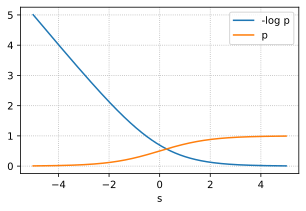

In [23]:
import matplotlib.pyplot as plt

s = np.linspace(-5, 5, 1000)
plt.figure(figsize=(5, 3))
plt.plot(s, np.log(1 + np.exp(-s)), label="-log p")
plt.plot(s, 1 / (1 + np.exp(-s)), label="p")
plt.legend()
plt.xlabel("s")
plt.grid(linestyle="dotted");

## Appendix: Weak supervision

In this section, we apply what we learned in this notebook to implement **weak supervision**.
The idea of weak supervision is that for each data point there is a latent true label that we do not have access to (even during training), instead we utilize weak signals from user-defined **labeling functions** (LFs). 

LFs can be thought of as heuristic rules that can be applied to a large subset of the data. In case the LF is not applicable, then the function simply abstains from making a prediction. Note that this is a realistic scenario, it's easier to describe rules than to manually annotate a large number of data. LFs provides noisy, less expensive labels, which can be useful when used to train noise-aware discriminative models. The material here is an exposition and implementation of the paper {cite}`data-programming`.

<br>

```{figure} ../../img/nn/01-weak-supervision-pipeline.png
---
name: 01-weak-supervision-pipeline.png
width: 100%
---
Pipeline for training a model based on weakly supervised labels. The third image is flipped (i.e. the flow of prediction is right to left.) 
These two tasks will be implemented in this notebook. [Source](https://cs.brown.edu/people/sbach/files/bach-icml17-slides.pdf)
```

### Toy example

Our task is to classify whether a sentence is a question or a quote. We will use true labels to evaluate the train and validation performance of the model. But this will not be used during training. In practice, we have a small labeled dataset for validation, that is a part of a large unlabeled dataset, which we want to somehow use for training. The toy dataset consists of 88 sentences:

```python
data = [
    "What would you name your boat if you had one? ",
    "What's the closest thing to real magic? ",
    "Who is the messiest person you know? ",
    "What will finally break the internet? ",
    "What's the most useless talent you have? ",
    "What would be on the gag reel of your life? ",
    ...
]
```

In [24]:
data = [
    "What would you name your boat if you had one? ",
    "What's the closest thing to real magic? ",
    "Who is the messiest person you know? ",
    "What will finally break the internet? ",
    "What's the most useless talent you have? ",
    "What would be on the gag reel of your life? ",
    "Where is the worst smelling place you've been?",
    "What Secret Do You Have That No One Else Knows Except Your Sibling/S?"
    "What Did You Think Was Cool Then, When You Were Young But Isn’t Cool Now?"
    "When Was The Last Time You Did Something And Regret Doing It?"
    "What Guilty Pleasure Makes You Feel Alive?"
    "Any fool can write code that a computer can understand. Good programmers write code that humans can understand.",
    "First, solve the problem. Then, write the code.",
    "Experience is the name everyone gives to their mistakes.",
    " In order to be irreplaceable, one must always be different",
    "Java is to JavaScript what car is to Carpet.",
    "Knowledge is power.",
    "Sometimes it pays to stay in bed on Monday, rather than spending the rest of the week debugging Monday’s code.",
    "Perfection is achieved not when there is nothing more to add, but rather when there is nothing more to take away.", 
    "Ruby is rubbish! PHP is phpantastic!",
    " Code is like humor. When you have to explain it, it’s bad.",
    "Fix the cause, not the symptom.",
    "Optimism is an occupational hazard of programming: feedback is the treatment. " ,
    "When to use iterative development? You should use iterative development only on projects that you want to succeed.",
    "Simplicity is the soul of efficiency.",
    "Before software can be reusable it first has to be usable.",
    "Make it work, make it right, make it fast.",
    "Programmer: A machine that turns coffee into code.",
    "Computers are fast; programmers keep it slow.",
    "When I wrote this code, only God and I understood what I did. Now only God knows.",
    "A son asked his father (a programmer) why the sun rises in the east, and sets in the west. His response? It works, don’t touch!",
    "How many programmers does it take to change a light bulb? None, that’s a hardware problem.",
    "Programming is like sex: One mistake and you have to support it for the rest of your life.",
    "Programming can be fun, and so can cryptography; however, they should not be combined.",
    "Programming today is a race between software engineers striving to build bigger and better idiot-proof programs, and the Universe trying to produce bigger and better idiots. So far, the Universe is winning.",
    "Copy-and-Paste was programmed by programmers for programmers actually.",
    "Always code as if the person who ends up maintaining your code will be a violent psychopath who knows where you live.",
    "Debugging is twice as hard as writing the code in the first place. Therefore, if you write the code as cleverly as possible, you are, by definition, not smart enough to debug it.",
    "Algorithm: Word used by programmers when they don’t want to explain what they did.",
    "Software and cathedrals are much the same — first we build them, then we pray.",
    "There are two ways to write error-free programs; only the third works.",
    "If debugging is the process of removing bugs, then programming must be the process of putting them in.",
    "99 little bugs in the code. 99 little bugs in the code. Take one down, patch it around. 127 little bugs in the code …",
    "Remember that there is no code faster than no code.",
    "One man’s crappy software is another man’s full-time job.",
    "No code has zero defects.",
    "A good programmer is someone who always looks both ways before crossing a one-way street.",
    "Deleted code is debugged code.",
    "Don’t worry if it doesn’t work right. If everything did, you’d be out of a job.",
    "It’s not a bug — it’s an undocumented feature.",
    "It works on my machine.",
    "It compiles; ship it.",
    "There is no Ctrl-Z in life.",
    "Whitespace is never white.",
    "What’s your favorite way to spend a day off?",
    "What type of music are you into?",
    "What was the best vacation you ever took and why?",
    "Where’s the next place on your travel bucket list and why?",
    "What are your hobbies, and how did you get into them?",
    "What was your favorite age growing up?",
    "Was the last thing you read?",
    "Would you say you’re more of an extrovert or an introvert?",
    "What's your favorite ice cream topping?",
    "What was the last TV show you binge-watched?",
    "Are you into podcasts or do you only listen to music?",
    "Do you have a favorite holiday? Why or why not?",
    "If you could only eat one food for the rest of your life, what would it be?",
    "Do you like going to the movies or prefer watching at home?",
    "What’s your favorite sleeping position?",
    "What’s your go-to guilty pleasure?",
    "In the summer, would you rather go to the beach or go camping?",
    "What’s your favorite quote from a TV show/movie/book?",
    "How old were you when you had your first celebrity crush, and who was it?",
    "What's one thing that can instantly make your day better?",
    "Do you have any pet peeves?",
    "What’s your favorite thing about your current job?",
    "What annoys you most?",
    "What’s the career highlight you’re most proud of?",
    "Do you think you’ll stay in your current gig awhile? Why or why not?",
    "What type of role do you want to take on after this one?",
    "Are you more of a work to live or a live to work type of person?",
    "Does your job make you feel happy and fulfilled? Why or why not?",
    "How would your 10-year-old self react to what you do now?",
    "What do you remember most about your first job?",
    "How old were you when you started working?",
    "What’s the worst job you’ve ever had?",
    "What originally got you interested in your current field of work?",
    "Have you ever had a side hustle or considered having one?",
    "What’s your favorite part of the workday?",
    "What’s the best career decision you’ve ever made?",
    "What’s the worst career decision you’ve ever made?",
    "Do you consider yourself good at networking?"
]

Then, we can define labeling functions. Notice that these are user-defined and requires some domain expertise to be effective:

In [25]:
QUESTION =  1
QUOTE    = -1
ABSTAIN  =  0

def lf_keyword_lookup(x):
    keywords = ["why", "what", "when", "who", "where", "how"]
    return QUESTION if any(word in x.lower() for word in keywords) else ABSTAIN

def lf_char_length(x):
    return QUOTE if len(x) > 100 else ABSTAIN

def lf_regex_endswith_dot(x):
    return QUOTE if x.endswith(".") else ABSTAIN

Applying this to our dataset we get the $\Lambda_{ij}$ matrix. We will also assign the true label:

In [26]:
import pandas as pd
import numpy as np
np.random.seed(0)

df = pd.DataFrame({"sentences": data})

df["LF1"] = df.sentences.map(lf_keyword_lookup)
df["LF2"] = df.sentences.map(lf_char_length)
df["LF3"] = df.sentences.map(lf_regex_endswith_dot)
df["y"]   = df.sentences.map(lambda x: 1 if x.strip().endswith("?") else -1)
df.head()

,sentences,LF1,LF2,LF3,y
0,What would you name your boat if you had one?,1,0,0,1
1,What's the closest thing to real magic?,1,0,0,1
2,Who is the messiest person you know?,1,0,0,1
3,What will finally break the internet?,1,0,0,1
4,What's the most useless talent you have?,1,0,0,1


Note that LF2 is intuitively not a good LF function. 
Indeed, we can look at the strength of the signals of each LF by comparing it with the true label. 
A labeling function is characterized by its **coverage** and **accuracy** (i.e. given it did not abstain):

In [27]:
# Note: the ff. shows *latent* LF parameters
print(f"coverage: {(df.LF1 != 0).mean():.3f}    acc: {(df[df.LF1 != 0].LF1 == df[df.LF1 != 0].y).mean():.3f}")
print(f"coverage: {(df.LF2 != 0).mean():.3f}    acc: {(df[df.LF2 != 0].LF2 == df[df.LF2 != 0].y).mean():.3f}")
print(f"coverage: {(df.LF3 != 0).mean():.3f}    acc: {(df[df.LF3 != 0].LF3 == df[df.LF3 != 0].y).mean():.3f}")

coverage: 0.545    acc: 0.750
coverage: 0.114    acc: 1.000
coverage: 0.432    acc: 1.000


**Remark.** Note that we generally do not have access to true labels for a representative sample of our dataset. Hence, even estimating the 
parameters of our LFs are not possible. The following sections will deal with algorithms for estimating this as well as for 
training a machine learning model with noisy labels.

### Basic theory

Here we will consider binary classification, although the method can be easily extended to the multiclass setting. For each data point $\boldsymbol{\mathsf{x}} \in \mathscr{X}$ the latent true label is denoted by $y \in \mathscr{Y} = \{-1, +1\}$. We have $n$ labeling functions $\lambda_j\colon \mathscr{X} \to \mathscr{Y} \cup \{0\}$ for $j = 1, \ldots, n.$ In case that the LF is not applicable, then the LF returns $0$ for *abstain*. This explains why we augmented the target space with the zero label. So if we have data points $\boldsymbol{\mathsf{x}}_i$ for $i = 1, \ldots, m$, then we get an $m \times n$ matrix of LF outputs $\Lambda_{ij} = \lambda_j(\boldsymbol{\mathsf{x}}_i)$.

Our first step is to estimate the distribution $p_{\delta, \gamma}(\Lambda=\lambda(\boldsymbol{\mathsf{x}}), Y=y)$ defined as the probability that LFs output $\lambda(\boldsymbol{\mathsf{x}}) = (\lambda_1(\boldsymbol{\mathsf{x}}), \ldots, \lambda_n(\boldsymbol{\mathsf{x}}))$ for a test instance $\boldsymbol{\mathsf{x}}$ with true label $y$. The parameters are chosen such that the marginal probability $p(\Lambda_{ij})$ of the observed LF outputs is maximized.
This parameters of the model are **coverage** $\delta = (\delta_1, \ldots, \delta_n)$ and **accuracy** $\gamma = (\gamma_1, \ldots, \gamma_n)$ of each LF. Once the parameters $\hat{\delta}$ and $\hat{\gamma}$ have been learned, we can train a **noise-aware** discriminative model by minimizing the ff. loss function:

$$
\mathscr{L}(\Theta) = 
\frac{1}{m}\sum_{i=1}^m \sum_{y=-1,+1} 
\ell(f_\Theta(\boldsymbol{\mathsf{x}}), y) \cdot 
{p_{\hat{\delta}, \hat{\gamma}}(Y = y \mid \Lambda = \lambda(\boldsymbol{\mathsf{x}}))}
$$

where $\ell$ is the instance loss. This looks like the usual loss except that the contribution for each target is summed over weighted by the probability of the target given the labeling of the input.

### Generative model

For each LF $\lambda_j$ we assign two parameters $(\delta_j, \gamma_j)$ corresponding to its coverage and accuracy. Coverage $\delta_j$ is defined as the probability of labeling an input, and accuracy as $\gamma_j$ as the probability of labeling it correctly. This assumes that the LFs have the same distribution for each label (e.g. not more accurate when the label is positive). Moreover, we assume that LF outputs are independent of each other. Hence,

$$
\begin{aligned}
p_{\delta, \gamma}(\Lambda = \lambda(\boldsymbol{\mathsf{x}})) 
&= \sum_{y=-1,+1}  p_{\delta, \gamma}(\Lambda = \lambda(\boldsymbol{\mathsf{x}}), Y = y) \\
&= \sum_{y=-1,+1} p(Y = y) \cdot p_{\delta, \gamma}(\Lambda = \lambda(\boldsymbol{\mathsf{x}}) \mid Y = y) \\
&= \sum_{y=-1,+1} p(Y = y) \cdot \prod_{j=1}^n \begin{cases} 
1 - \delta_j \quad& \phantom{y}\lambda_j(\boldsymbol{\mathsf{x}}) &= \phantom{-}0 \\
\delta_j\gamma_j \quad& y \lambda_j(\boldsymbol{\mathsf{x}}) &= +1 \\
\delta_j(1 - \gamma_j) \quad& y \lambda_j(\boldsymbol{\mathsf{x}}) &= -1 \\
\end{cases}.
\end{aligned}
$$

Our goal therefore is to find parameters that maximize the observed LF outputs for our dataset:


$$
\begin{aligned}
(\hat{\delta}, \hat{\gamma}) 
&= \underset{\delta,\gamma}{\text{arg min}}\sum_{i=1}^m -\log \; p_{\delta, \gamma}(\Lambda_{i}) \\
&= \underset{\delta,\gamma}{\text{arg min}}\sum_{i=1}^m -\log 
\left( 
    \sum_{y=-1,+1} p_y 
    \cdot 
    \prod_{j=1}^n 
    \begin{cases} 
        1 - \delta_j            \quad& \phantom{y}\Lambda_{ij} &= \phantom{-}0 \\
        \delta_j\gamma_j        \quad&          y \Lambda_{ij} &= +1 \\
        \delta_j(1 - \gamma_j)  \quad&          y \Lambda_{ij} &= -1
    \end{cases} 
\right).
\end{aligned}
$$

We implement the above equations using some clever indexing:

In [28]:
import torch

delta = torch.tensor([0.3, 0.3, 0.3, 0.3])  # coverage
gamma = torch.tensor([0.7, 0.6, 0.8, 0.9])  # accuracy

n = 4
L = torch.tensor([
    [-1,  0, +1, +1],
    [+1, -1, -1,  0]
])

params = torch.stack([
    1 - delta,              # abstained
    delta * gamma,          # accurate
    delta * (1 - gamma)     # inaccurate
], dim=0)

params  # Note sum along dim=0 is 1, i.e. sum of all p(λ | y) for λ = -1, 0, 1 is 1.

tensor([[0.7000, 0.7000, 0.7000, 0.7000],
        [0.2100, 0.1800, 0.2400, 0.2700],
        [0.0900, 0.1200, 0.0600, 0.0300]])

We will use the empirical LF matrix to pick out the appropriate weight given its value:

In [29]:
# p(L | y = +1)
params[L, torch.arange(n)]

tensor([[0.0900, 0.7000, 0.2400, 0.2700],
        [0.2100, 0.1200, 0.0600, 0.7000]])

Notice that non-abstained probabilities will flip:

In [30]:
# p(L | y = -1)
params[-L, torch.arange(n)]

tensor([[0.2100, 0.7000, 0.0600, 0.0300],
        [0.0900, 0.1800, 0.2400, 0.7000]])

Let $p_{y=-1} = 0.7$ and $p_{y=+1} = 0.3$. The marginal probability of the LF outputs for each instance is given by:

In [31]:
py = [0.0, 0.3, 0.7]    # zero-index = dummy
p_pos = py[+1] * (params[+L, torch.arange(n)]).prod(dim=1) 
p_neg = py[-1] * (params[-L, torch.arange(n)]).prod(dim=1) 
p = p_pos + p_neg
p

tensor([0.0014, 0.0022])

Note that we generally have $m \gg 1$ terms in $[0, 1]$ if we take the product. So we use $\log$ to convert it to a sum:

In [32]:
print("     p(Λ):", p.prod().item())
print("-log p(Λ):", -torch.log(p).sum().item())

     p(Λ): 3.1337897326011444e-06
-log p(Λ): 12.673267364501953


### Simulated LFs

Generating a toy dataset and simulated values of LFs. Here we also set the prior probability on the labels:

In [33]:
import numpy as np

m = 10000
LABEL_PROBS = {-1: 0.40, 1: 0.60}
y_true = np.random.choice([-1, 1], size=m, p=[LABEL_PROBS[-1], LABEL_PROBS[1]])

s = 2 * torch.pi * torch.rand(m, 1)
r = 0.5 * (torch.tensor(y_true).view(-1, 1) + 1)    # -1 -> r = 0, +1 -> r = 1
x = torch.cat([r * torch.cos(s), r * torch.sin(s)], dim=1) + 0.05 * torch.randn(m, 2)

t = np.linspace(0, 2*np.pi, 100)
x0 = 0.5 * np.cos(t)
x1 = 0.5 * np.sin(t)
x_neg = x[torch.where(torch.tensor(y_true) == -1)]
x_pos = x[torch.where(torch.tensor(y_true) == +1)]

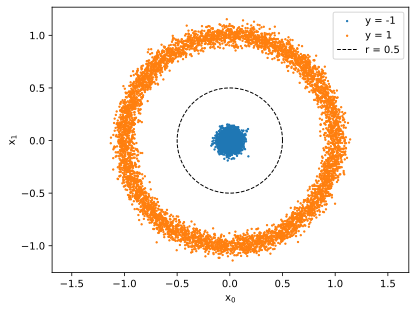

In [34]:
import matplotlib.pyplot as plt

def plot_dataset(x_neg, x_pos):
    plt.scatter(x_neg[:, 0], x_neg[:, 1], s=2.0, color="C0", label="y = -1")
    plt.scatter(x_pos[:, 0], x_pos[:, 1], s=2.0, color="C1", label="y = 1")
    plt.plot(x0, x1, color='black', linewidth=1, linestyle='dashed', label="r = 0.5")
    plt.xlabel("x$_0$")
    plt.ylabel("x$_1$")
    plt.legend()
    plt.axis('equal');

plot_dataset(x_neg, x_pos)

Note that radius less than 0.5 determines the label as negative (with high probability):

In [35]:
# 2x - 1: [0, 1] -> [-1, 1] 
((2 * (torch.sqrt((x ** 2).sum(dim=1)) >= 0.5).float() - 1).numpy() == y_true).mean()

1.0

We use this to write simulated LFs with given parameters:

In [36]:
def lf_sim(coverage, accuracy):
    def predict(x):
        m = x.shape[0]
        cov_mask = (torch.rand(m) <= coverage).float()
        acc_mask = torch.tensor(np.random.choice([-1.0, 1.0], size=m, p=[1 - accuracy, accuracy]))
        y = (2 * (torch.sqrt((x ** 2).sum(dim=1)) >= 0.5).float() - 1)
        return y * cov_mask * acc_mask
    return predict

# example
p = lf_sim(0.3, 0.8)(x).numpy()
print("cov:", (p != 0).mean())
print("acc:", (p[p != 0] == y_true[p != 0]).mean())

cov: 0.298
acc: 0.8


Showing the empirical LF matrix:

In [37]:
import pandas as pd
lf_params = [(0.40, 0.85), (0.40, 0.85), (0.40, 0.85), (0.60, 0.80), (0.30, 0.90)]
labeling_funcs = [lf_sim(*param) for param in lf_params]

df = pd.DataFrame({"y": y_true})
df["x0"] = x[:, 0].numpy()
df["x1"] = x[:, 1].numpy()
for j, lf in enumerate(labeling_funcs):
    df[f"LF{j + 1}"] = lf(x).int().numpy()

print(df.shape)
df.head()

(10000, 8)


,y,x0,x1,LF1,LF2,LF3,LF4,LF5
0,1,-0.106006,0.984215,0,0,1,0,0
1,1,-0.576583,0.903105,0,0,0,0,0
2,1,0.947907,-0.253381,0,1,1,0,0
3,1,0.914950,-0.381159,0,1,-1,1,0
4,1,0.683839,0.745961,1,1,1,0,0


Splitting for evaluation:

In [38]:
# 80-20
SPLIT_RATIO = 0.8
m = x.shape[0]
x_train = x[:int(SPLIT_RATIO * m)]
x_valid = x[int(SPLIT_RATIO * m):]
y_train = torch.tensor(y_true[:int(SPLIT_RATIO * m)])
y_valid = torch.tensor(y_true[int(SPLIT_RATIO * m):])

Generative model class:

In [39]:
from tqdm.notebook import tqdm


class GenModel:
    def __init__(self, labeling_funcs: list, label_probs: dict):
        self.lfs = labeling_funcs
        self.py = torch.tensor([0.0, label_probs[1], label_probs[-1]])      # zero-index = dummy
        self.params = None

    def loss_fn(self, params, L):
        n = L.shape[1]
        p_pos = (params[+L, torch.arange(n)] * self.py[+1]).prod(dim=1)     # joint p(Λ, y = +1)
        p_neg = (params[-L, torch.arange(n)] * self.py[-1]).prod(dim=1)     # joint p(Λ, y = -1)
        p = p_pos + p_neg                                                   # p(Λ)
        return -torch.log(p).mean()

    def fit(self, x_train, x_valid=None, bs=32, epochs=1, lr=0.0001, lr_decay=1.0):
        """MLE estimate of coverage and accuracy parameters of LFs."""
        L_train = self.lf_outputs(x_train)
        L_valid = self.lf_outputs(x_valid) if x_valid is not None else None
        m, n = L_train.shape

        delta = torch.randn(n, requires_grad=True)  # coverage score
        gamma = torch.randn(n, requires_grad=True)  # accuracy score
        delta.retain_grad()
        gamma.retain_grad()

        history = {"train": [], "valid": [], "valid_steps": []}
        checkpoint = (None, np.inf)

        try:
            for epoch in tqdm(range(epochs)):
                B = torch.randperm(m)
                for i in range(m // bs):
                    batch = B[i * bs: (i + 1) * bs]

                    # Note: weights are scores => need to convert to probs
                    p_delta = 1. / (1. + torch.exp(-delta))
                    p_gamma = 1. / (1. + torch.exp(-gamma))
                    params = torch.stack([
                        1 - p_delta,                # abstained
                        p_delta * p_gamma,          # accurate
                        p_delta * (1 - p_gamma)     # inaccurate
                    ], dim=0)

                    loss = self.loss_fn(params, L_train[batch])
                    loss.backward(retain_graph=True)

                    with torch.no_grad():
                        delta -= lr * (lr_decay ** epoch) * delta.grad
                        gamma -= lr * (lr_decay ** epoch) * gamma.grad
                        delta.grad = None
                        gamma.grad = None
                        
                        history["train"].append(loss.item())

                    del loss
                    torch.cuda.empty_cache()
                
                with torch.no_grad():
                    if L_valid is not None:
                        val_loss = self.loss_fn(params, L_valid)
                        history["valid"].append(val_loss.item())
                        history["valid_steps"].append((epoch + 1) * (m // bs))
                        if val_loss.item() < checkpoint[1]:
                            checkpoint = (params, val_loss.item())

        except KeyboardInterrupt:
            print("Training stopped.")

        self.params = checkpoint[0]
        return history
    
    def predict(self, x):
        """Predict labels. Use estimate of accuracy as weights for LF outputs 
        essentially forming a voting classifier. Note: This assumes enough LFs 
        so we rarely get Λ[i] = [0, ..., 0] ☺. """
        L = self.lf_outputs(x)
        gamma = self.params[1, :] / (1 - self.params[0, :])
        return 2 * ((gamma * L).sum(dim=1) > 0).long() - 1
    
    def infer_joint_proba(self, L, y: int):
        """Return p(Λ, y) i.e. estimated joint probability of (Λ, y)."""
        n = L.shape[1]
        return (self.params[y * L, torch.arange(n)] * self.py[y]).prod(dim=1)
    
    def lf_outputs(self, x):
        """Construct Λ matrix from LFs."""
        L = torch.stack([lf(x) for lf in self.lfs], dim=1)
        return L.long()


gen_model = GenModel(labeling_funcs, LABEL_PROBS)
history = gen_model.fit(x_train, x_valid, bs=4096, epochs=35000, lr=0.01)

  0%|          | 0/35000 [00:00<?, ?it/s]

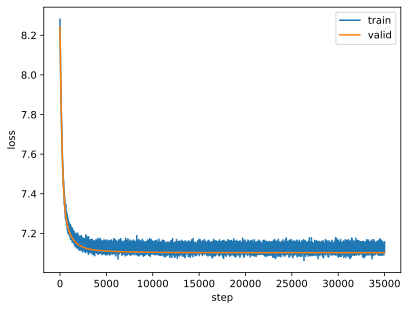

In [40]:
plt.plot(history["train"], label="train")
plt.plot(history["valid_steps"], history["valid"], label="valid")
plt.ylabel("loss")
plt.xlabel("step")
plt.legend();

In [41]:
print("latent:")
print([f"{cov:.4f}" for cov, acc in lf_params])
print([f"{acc:.4f}" for cov, acc in lf_params])

latent:
['0.4000', '0.4000', '0.4000', '0.6000', '0.3000']
['0.8500', '0.8500', '0.8500', '0.8000', '0.9000']


In [42]:
print("estimate:")
print([f"{cov:.4f}" for cov in (1 - gen_model.params[0, :]).tolist()])
print([f"{acc:.4f}" for acc in (gen_model.params[1, :] / (1 - gen_model.params[0, :])).tolist()])

estimate:
['0.3971', '0.3900', '0.3986', '0.6010', '0.2988']
['0.7483', '0.7368', '0.7476', '0.7155', '0.7866']


Note it was at least able to get the ranking between accuracies correctly.

**Inference.** To predict labels, we use $\hat{\gamma}$, i.e. the model's estimate of accuracy, as weights for LF outputs essentially forming a voting classifier. Note that this assumes enough LFs with sufficiently high coverage so we rarely get $\lambda(\boldsymbol{\mathsf{x}}) = [0, ..., 0].$

In [43]:
from sklearn.metrics import f1_score, confusion_matrix

def evaluate(model, x, y):
    m = x.shape[0]
    preds = model.predict(x)
    f1 = f1_score(y.numpy(), preds.numpy())
    print(confusion_matrix(y.numpy(), preds.numpy()))
    return {"f1": f1, "m": m, "message": f"m={m}, f1={f1:.5f}"}

print(evaluate(gen_model, x_train, y_train)["message"]); print()
print(evaluate(gen_model, x_valid, y_valid)["message"])

[[2897  346]
 [ 803 3954]]
m=8000, f1=0.87314

[[ 697   89]
 [ 195 1019]]
m=2000, f1=0.87769


### Noise-aware training

Noise-aware training amounts to weighting the loss with the estimate of the generative model for each target ${p_{\hat{\delta}, \hat{\gamma}}(y \mid \lambda(\boldsymbol{\mathsf{x}}))} = {p_{\hat{\delta}, \hat{\gamma}}(y, \lambda(\boldsymbol{\mathsf{x}}))}\, /\, {p_{\hat{\delta}, \hat{\gamma}}(\lambda(\boldsymbol{\mathsf{x}}))}$. This can be implemented as follows:

In [44]:
import torch.nn as nn
from tempfile import NamedTemporaryFile

class NoiseAwareTrainer:
    def __init__(self, clf, gen_model, labeling_funcs: list):
        self.clf = clf
        self.lfs = labeling_funcs
        self.gen_model = gen_model

    @torch.no_grad()
    def target_cond_proba(self, y, L):
        """Estimate of target prob given LF observations, i.e. p(y | Λ)."""
        p_neg = self.gen_model.infer_joint_proba(L, -1)           # p(Λ, y=-1)
        p_pos = self.gen_model.infer_joint_proba(L, +1)           # p(Λ, y=+1)
        p_tot = p_neg + p_pos                                     # p(Λ)
        return self.gen_model.infer_joint_proba(L, y) / p_tot     # p(y | Λ) = p(Λ, y) / p(Λ)

    def run(self, x_train, x_valid=None, epochs=10, bs=8, lr=0.001, alpha=0.0):
        m = x_train.shape[0]
        history = {"train": [], "valid": [], "valid_steps": []}
        L_train = self.lf_outputs(x_train)
        L_valid = self.lf_outputs(x_valid) if x_valid is not None else None
        best_loss = np.inf
        optim = torch.optim.SGD(self.clf.parameters(), lr=lr, weight_decay=alpha, momentum=0.1)
        tmp = NamedTemporaryFile(suffix=".pt", delete=True)

        try: 
            for epoch in tqdm(range(epochs)):
                B = torch.randperm(m)
                for i in range(m // bs):
                    batch = B[i * bs: (i + 1) * bs]

                    with torch.no_grad():
                        p_neg_cond = self.target_cond_proba(-1, L_train[batch])
                        p_pos_cond = self.target_cond_proba(+1, L_train[batch])
                        p = torch.concat([p_neg_cond, p_pos_cond], dim=0)
                    
                    fx = self.clf(x[batch])
                    s = torch.concat([-1 * fx, 1 * fx], dim=0)
                    loss = (torch.log(1 + torch.exp(-s)) * p).mean()

                    # gradient step
                    loss.backward()
                    optim.step()
                    optim.zero_grad()

                    # callbacks
                    history["train"].append(loss.item())
                            
                    del loss
                    torch.cuda.empty_cache()
                
                with torch.no_grad():
                    if x_valid is not None:
                        fx = self.clf(x_valid)
                        p_neg_cond = self.target_cond_proba(-1, L_valid)
                        p_pos_cond = self.target_cond_proba(+1, L_valid)
                        p = torch.concat([p_neg_cond, p_pos_cond], dim=0)
                        s = torch.concat([-1 * fx, 1 * fx], dim=0)
                        val_loss = (torch.log(1 + torch.exp(-s)) * p).mean()
                        
                        history["valid"].append(val_loss.item())
                        history["valid_steps"].append((epoch + 1) * (m // bs))
                        if val_loss < best_loss:
                            best_loss = val_loss.item()
                            torch.save(self.clf.state_dict(), tmp.name)

        except KeyboardInterrupt:
            print("Training stopped.")

        self.clf.load_state_dict(torch.load(tmp.name))
        return history
    
    def lf_outputs(self, x):
        L = torch.stack([lf(x) for lf in self.lfs], dim=1).long()
        return L

    @torch.no_grad()
    def predict_proba(self, x):
        s = self.clf(x).view(-1)
        return 1 / (1 + torch.exp(-s))

    @torch.no_grad()
    def predict(self, x):
        s = self.clf(x).view(-1)
        return 2 * (s > 0).long() - 1


clf = nn.Sequential(nn.Linear(2, 32), nn.ReLU(), nn.Linear(32, 1))
trainer = NoiseAwareTrainer(clf, gen_model, labeling_funcs=labeling_funcs)
history = trainer.run(x_train, x_valid, epochs=60, bs=16, lr=0.003, alpha=0.0)

  0%|          | 0/60 [00:00<?, ?it/s]

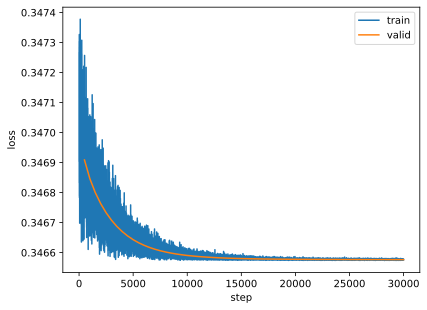

In [45]:
plt.plot(history["train"], label="train")
plt.plot(history["valid_steps"], history["valid"], label="valid")
plt.ylabel("loss")
plt.xlabel("step")
plt.legend();

In [46]:
print(evaluate(trainer, x_train, y_train)["message"]); print()
print(evaluate(trainer, x_valid, y_valid)["message"])

[[1939 1304]
 [2168 2589]]
m=8000, f1=0.59861

[[446 340]
 [531 683]]
m=2000, f1=0.61064


### Training with noisy labels

Here we attempt to directly train the model with noisy labels from the generative model:

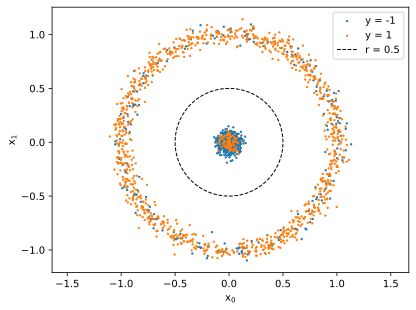

In [50]:
y_weak_train = (gen_model.predict(x_train) + 1) // 2
y_weak_valid = (gen_model.predict(x_valid) + 1) // 2
plot_dataset(x_valid[y_weak_valid == 0], x_valid[y_weak_valid == 1])

Model training with the same setup as above:

  0%|          | 0/60 [00:00<?, ?it/s]

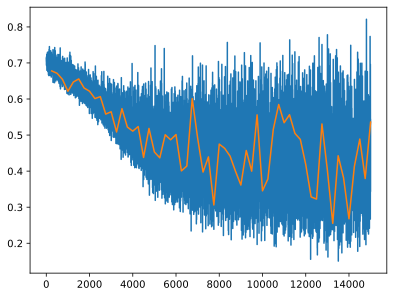

In [48]:
import torch.nn.functional as F
from tempfile import NamedTemporaryFile

clf = nn.Sequential(nn.Linear(2, 32), nn.ReLU(), nn.Linear(32, 2))

bs = 32
lr = 0.003
epochs = 60
weight = torch.tensor([LABEL_PROBS[+1], LABEL_PROBS[-1]])
loss_fn = lambda s, y: F.cross_entropy(s, y, weight=weight)
optim = torch.optim.SGD(clf.parameters(), lr=lr, momentum=0.1)

history = []
history = {"train": [], "valid": [], "valid_steps": []}
best_loss = np.inf
m = len(x_train)
tmp = NamedTemporaryFile(suffix=".pt", delete=True)

for epoch in tqdm(range(epochs)):
    B = torch.randperm(len(x_train))
    for i in range(m // bs):
        batch = B[i * bs: (i + 1) * bs]
        logits = clf(x_train[batch])
        loss = loss_fn(logits, y_weak_train[batch])
        loss.backward()
        optim.step()
        optim.zero_grad()
        history["train"].append(loss.item())
    
    with torch.no_grad():
        logits = clf(x_valid)
        val_loss = loss_fn(logits, y_weak_valid)
        history["valid"].append(loss.item())
        history["valid_steps"].append((epoch + 1) * (m // bs))
        if val_loss < best_loss:
            best_loss = val_loss.item()
            torch.save(clf.state_dict(), tmp.name)

# load best weights
clf.load_state_dict(torch.load(tmp.name))
plt.plot(history["train"])
plt.plot(history["valid_steps"], history["valid"]);

**Remark.** As the model learns better weights, noisy labels induce increasingly higher losses. 
Note we get to ~0.2 loss. This indicates that this model performed better. Indeed, 
looking at performance versus latent labels:

In [49]:
@torch.no_grad()
def evaluate_model(model, x, y):
    m = x.shape[0]
    preds = 2 * torch.argmax(model(x), dim=1) - 1
    f1 = f1_score(y.numpy(), preds.numpy())
    print(confusion_matrix(y.numpy(), preds.numpy()))
    return {"f1": f1, "m": m, "message": f"m={m}, f1={f1:.4f}"}

print(evaluate_model(clf, x_train, y_train)["message"]); print()
print(evaluate_model(clf, x_valid, y_valid)["message"])

[[3243    0]
 [   0 4757]]
m=8000, f1=1.0000

[[ 786    0]
 [   0 1214]]
m=2000, f1=1.0000


!!!

---

■